# NTHA Recall Analysis

The purpose of this analysis is to summarize and better understand recall trends. This will help prepare for service disruptions caused by recall campaigns.
Please see the summary of findings for an analysis of the data. The summary also includes steps for future analysis and modeling. The code and
visualizations are provided here.

Variable Name|Description
--- | ---
RECORD_ID|RUNNING SEQUENCE NUMBER, WHICH UNIQUELY IDENTIFIES THE RECORD.
CAMPNO|NHTSA CAMPAIGN NUMBER
MAKETXT|VEHICLE/EQUIPMENT MAKE
MODELTXT|VEHICLE/EQUIPMENT MODEL
YEARTXT|MODEL YEAR, 9999 IF UNKNOWN or NaN
MFGCAMPNO|MFR CAMPAIGN NUMBER
COMPNAME|COMPONENT DESCRIPTION
MFGNAME|MANUFACTURER THAT FILED DEFECT/NONCOMPLIANCE REPORT
BGMAN|BEGIN DATE OF MANUFACTURING
ENDMAN|END DATE OF MANUFACTURING
RCLTYPECD|VEHICLE, EQUIPMENT OR TIRE REPORT
POTAFF|POTENTIAL NUMBER OF UNITS AFFECTED
ODATE|DATE OWNER NOTIFIED BY MFR
INFLUENCED_BY|RECALL INITIATOR (MFR/OVSC/ODI)
MFGTXT|MANUFACTURERS OF RECALLED VEHICLES/PRODUCTS
RCDATE|REPORT RECEIVED DATE
DATEA|RECORD CREATION DATE
RPNO|REGULATION PART NUMBER
FMVSS|FEDERAL MOTOR VEHICLE SAFETY STANDARD NUMBER
DESC_DEFECT|DEFECT SUMMARY
CONEQUENCE_DEFECT|CONSEQUENCE SUMMARY
CORRECTIVE_ACTION|CORRECTIVE SUMMARY
NOTES|RECALL NOTES
RCL_CMPT_ID|NUMBER THAT UNIQUELY IDENTIFIES A RECALLED COMPONENT.
MFR_COMP_NAME|MANUFACTURER-SUPPLIED COMPONENT NAME
MFR_COMP_DESC|MANUFACTURER-SUPPLIED COMPONENT DESCRIPTION
MFR_COMP_PTNO|MANUFACTURER-SUPPLIED COMPONENT PART NUMBER

In [54]:
from datetime import datetime as dt

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

datecols = [8,9,12,15,16]
colnames = ['RECORD_ID','CAMPNO','MAKETXT','MODELTXT','YEARTXT','MFGCAMPNO','COMPNAME','MFGNAME','BGMAN','ENDMAN','RCLTYPECD',
        'POTAFF','ODATE','INFLUENCED_BY','MFGTXT','RCDATE','DATEA','RPNO','FMVSS','DESC_DEFECT','CONEQUENCE_DEFECT',
        'CORRECTIVE_ACTION','NOTES','RCL_CMPT_ID','MFR_COMP_NAME','MFR_COMP_DESC','MFR_COMP_PTNO']


file = 'FLAT_RCL.txt'

data = pd.read_csv(file, sep = '\t', names=colnames, parse_dates=datecols, header=0, on_bad_lines='warn', low_memory=False)
print('Raw data dimensions: ',raw.shape, '\n')

Skipping line 188394: expected 27 fields, saw 34



Raw data dimensions:  (249279, 27) 


In [55]:
# drop 1 record in POTAFF column
data.dropna(subset=['POTAFF'], axis=0, inplace=True)

# inspect the data
print('Relevant data dimensions: ', data.shape, '\n')
print(data.info())
data.head()

Relevant data dimensions:  (249279, 27) 

<class 'pandas.core.frame.DataFrame'>
Index: 249279 entries, 0 to 249564
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   RECORD_ID          249279 non-null  int64         
 1   CAMPNO             249279 non-null  object        
 2   MAKETXT            249279 non-null  object        
 3   MODELTXT           249279 non-null  object        
 4   YEARTXT            249279 non-null  int64         
 5   MFGCAMPNO          151264 non-null  object        
 6   COMPNAME           249279 non-null  object        
 7   MFGNAME            249274 non-null  object        
 8   BGMAN              115259 non-null  object        
 9   ENDMAN             115503 non-null  object        
 10  RCLTYPECD          249279 non-null  object        
 11  POTAFF             249279 non-null  float64       
 12  ODATE              237521 non-null  object        
 13  INFLUEN

,RECORD_ID,CAMPNO,MAKETXT,MODELTXT,YEARTXT,MFGCAMPNO,COMPNAME,MFGNAME,BGMAN,ENDMAN,...,RPNO,FMVSS,DESC_DEFECT,CONEQUENCE_DEFECT,CORRECTIVE_ACTION,NOTES,RCL_CMPT_ID,MFR_COMP_NAME,MFR_COMP_DESC,MFR_COMP_PTNO
0,2,02V288000,FORD,FOCUS,2001,02S41,ELECTRICAL SYSTEM:12V/24V/48V BATTERY:CABLES,FORD MOTOR COMPANY,19990719,20010531,...,NaN,NaN,CERTAIN PASSENGER VEHICLES EQUIPPED WITH ZETEC...,"THIS, IN TURN, COULD CAUSE THE BATTERY CABLES ...",DEALERS WILL INSPECT THE BATTERY CABLES FOR TH...,ALSO CONTACT THE NATIONAL HIGHWAY TRAFFIC SAFE...,000015339000215022000000202,NaN,NaN,NaN
1,3,02V236000,JAYCO,FT EAGLE 10 SG,2003,NaN,EQUIPMENT:OTHER:LABELS,"JAYCO, INC.",20020730,20020813,...,NaN,NaN,"ON CERTAIN FOLDING TENT CAMPERS, THE FEDERAL C...","IF THE TIRES WERE INFLATED TO 80 PSI, THEY COU...",OWNERS WILL BE MAILED CORRECT LABELS FOR INSTA...,"ALSO, CUSTOMERS CAN CONTACT THE NATIONAL HIGHW...",000015210000106403000000349,NaN,NaN,NaN
2,4,02V237000,HOLIDAY RAMBLER,ENDEAVOR,2000,NaN,STRUCTURE,MONACO COACH CORP.,NaN,NaN,...,NaN,NaN,"ON CERTAIN CLASS A MOTOR HOMES, THE FLOOR TRUS...",CONDITIONS CAN RESULT IN THE BOTTOMING OUT THE...,DEALERS WILL INSPECT THE FLOOR TRUSS NETWORK S...,CUSTOMERS CAN ALSO CONTACT THE NATIONAL HIGHWA...,000015211000083965000000272,NaN,NaN,NaN
3,5,02V237000,HOLIDAY RAMBLER,ENDEAVOR,1999,NaN,STRUCTURE,MONACO COACH CORP.,NaN,NaN,...,NaN,NaN,"ON CERTAIN CLASS A MOTOR HOMES, THE FLOOR TRUS...",CONDITIONS CAN RESULT IN THE BOTTOMING OUT THE...,DEALERS WILL INSPECT THE FLOOR TRUSS NETWORK S...,CUSTOMERS CAN ALSO CONTACT THE NATIONAL HIGHWA...,000015211000080938000000272,NaN,NaN,NaN
4,6,02V237000,HOLIDAY RAMBLER,VACATIONER,2000,NaN,STRUCTURE,MONACO COACH CORP.,NaN,NaN,...,NaN,NaN,"ON CERTAIN CLASS A MOTOR HOMES, THE FLOOR TRUS...",CONDITIONS CAN RESULT IN THE BOTTOMING OUT THE...,DEALERS WILL INSPECT THE FLOOR TRUSS NETWORK S...,CUSTOMERS CAN ALSO CONTACT THE NATIONAL HIGHWA...,000015211000087576000000272,NaN,NaN,NaN


In [56]:
# total campaigns
total_camps = data['CAMPNO'].nunique()

#total cars affected in all camps
total_cars = data.groupby('CAMPNO')['POTAFF'].mean().sum()

print("There are {total_camps:,} recalls potentially affecting {total_cars:,} vehicles in this dataset.".format(total_camps=total_camps, total_cars=int(total_cars)))

There are 27,481 recalls potentially affecting 1,281,608,568 vehicles in this dataset.


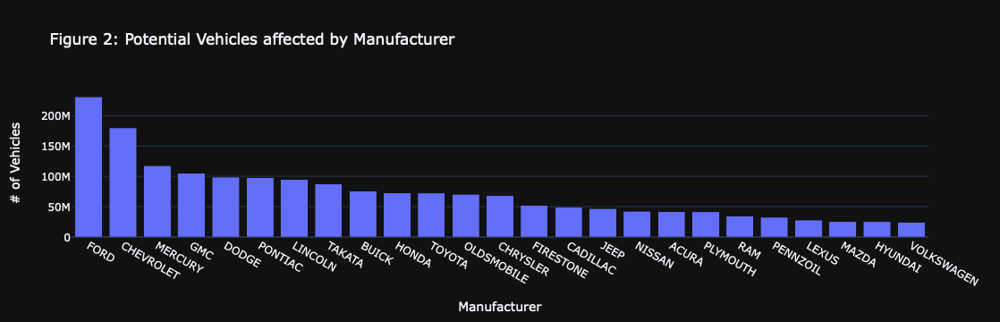

In [57]:
# total cars affected by each manufacturer
total_camps_mfr = data.groupby(['MAKETXT','CAMPNO'])['POTAFF'].mean().groupby('MAKETXT').sum().sort_values(ascending=False)

# Select only the top 25 manufacturers
top_25_total_cars_mfr = total_camps_mfr.head(25)

# Plotting
fig = px.bar(x=top_25_total_cars_mfr.index, y=top_25_total_cars_mfr, title='Figure 2: Potential Vehicles affected by Manufacturer',
      labels={'x':'Manufacturer', 'y':'# of Vehicles'})

# Show the plot
fig.show()


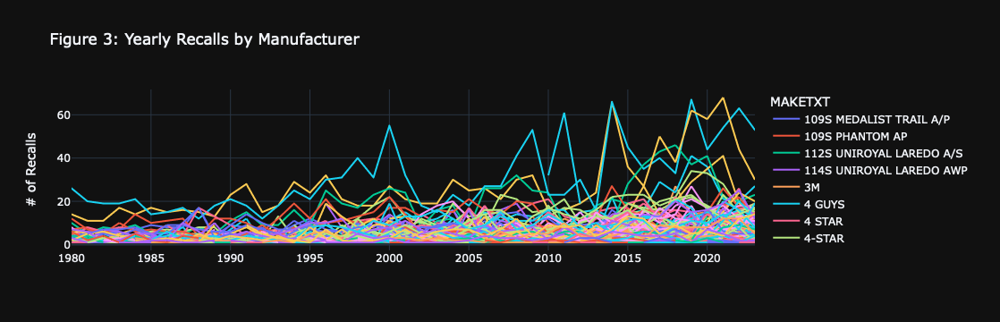

In [53]:
# group yearly trends
yearly_camps_mfr = data.groupby([data.DATEA.dt.year, data.MAKETXT])['CAMPNO'].nunique()

# plot yearly trends
px.line(yearly_camps_mfr.unstack(level=1)[1:], title='Figure 3: Yearly Recalls by Manufacturer', labels={'DATEA':'', 'value':'# of Recalls'})

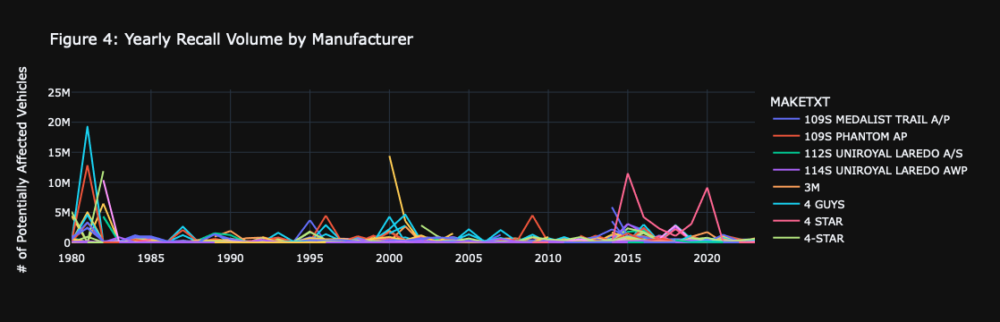

In [50]:
# group yearly trends
yearly_potaff_mfr = data.groupby([data.DATEA.dt.year, data.MAKETXT])['POTAFF'].mean()

# plot yearly trends
px.line(yearly_potaff_mfr.unstack(level=1)[1:], title='Figure 4: Yearly Recall Volume by Manufacturer', labels={'DATEA':'', 'value':'# of Potentially Affected Vehicles'})

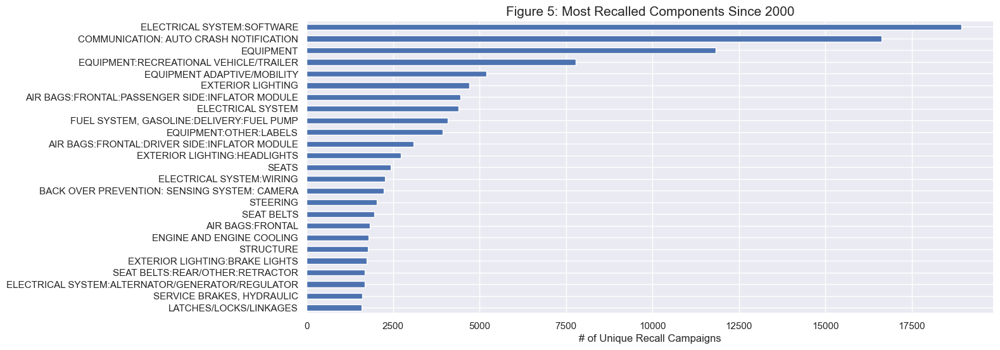

In [60]:
# Show most recalled parts since 2000
parts = data[data.DATEA.dt.year >= 2000].groupby([data.COMPNAME])['CAMPNO'].count()

# Plot 25 most recalled parts since 2000, but sort them in ascending order this time
sns.set()
plt.subplots(figsize=(14, 6))
parts.sort_values(ascending=True).tail(25).plot(kind='barh')  # Use ascending=True and tail to select the top items
plt.title('Figure 5: Most Recalled Components Since 2000', fontsize=15)
plt.ylabel('')
plt.xlabel('# of Unique Recall Campaigns')
plt.show()
